# Import Base Packages

In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

# Interface function to feature engineering data

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

column_names = [ 'age', 'workclass', 'fnlwgt', 'education', 'educational-num', 
                'marital-status', 'occupation', 'relationship', 'race', 
                'gender', 'capital-gain', 'capital-loss', 'hours-per-week', 
                'native-country', 'income' ]

columns_to_encoding = [ 'workclass', 'marital-status', 'occupation',
                        'relationship', 'race', 'gender' ]

columns_to_normalize = [ 'age', 'educational-num', 'hours-per-week', 
                         'capital-gain', 'capital-loss' ]

le = LabelEncoder()
scaler = StandardScaler()
pl = PolynomialFeatures(2, include_bias=False)

def feature_engineering(filename, train=True):
    df = pd.read_csv(filename, index_col=False)        
    df.drop(['fnlwgt', 'education', 'native-country'], axis=1, inplace=True)
    df = pd.get_dummies(df, columns=columns_to_encoding)
    df["income"] = le.fit_transform(df['income'])
    if train:
        X_temp = pl.fit_transform(df[columns_to_normalize])
        X_temp = scaler.fit_transform(X_temp)
        df.drop(columns_to_normalize, axis=1, inplace=True)
        X_train = np.hstack((df.values, X_temp))
        y_train = df['income']
        columns_names = pl.get_feature_names(df.columns)
        return np.hstack((df.columns.values, columns_names)), X_train, y_train
    else:
        X_temp = pl.transform(df[columns_to_normalize])
        X_temp = scaler.transform(X_temp)
        df.drop(columns_to_normalize, axis=1, inplace=True)
        X_test = np.hstack((df.values, X_temp))
        y_test = df['income']
        columns_names = pl.get_feature_names(df.columns)
        return np.hstack((df.columns.values, columns_names)), X_test, y_test

# Load Data

In [3]:
columns_names, X, y = feature_engineering('../input/adult.csv', train=True)

In [4]:
from sklearn.model_selection import train_test_split
def rmnan(X, y):
    X_, y_ = [], []    
    for x, yt in zip(X, y):                
        if np.isnan(x).any() or np.isnan(yt).any():
            continue
        X_.append(x)
        y_.append(yt)        
    return np.array(X_), np.array(y_)

X, y = rmnan(X, y)

In [5]:
X, X_test, y, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
y.shape, y_test.shape

((34189,), (14653,))

# Find Best number of components to PCA

In [6]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold

param_distribution = {
    'max_depth': np.arange(1, 15),
}

scoring = {    
    'Accuracy': make_scorer(accuracy_score),
    'F1_Score': make_scorer(fbeta_score, beta=1, average='micro'),    
}

In [7]:
result = []
kf = RepeatedStratifiedKFold(n_splits=2, n_repeats=2)
for fold, (train_index, test_index) in enumerate(kf.split(X, y)):
    X_tr, X_tst = X[train_index], X[test_index]
    y_tr, y_tst = y[train_index], y[test_index]

    for i in range(1, 20):
        # train
        pca = PCA(i)
        X_t = pca.fit_transform(X_tr)
        search_cv = RandomizedSearchCV(DecisionTreeClassifier(), param_distribution,
                                       scoring=scoring, n_jobs=-1, 
                                       cv=RepeatedStratifiedKFold(n_splits=2, n_repeats=2), 
                                       refit='F1_Score') 
        search_cv.fit(X_t, y_tr)
        model = search_cv.best_estimator_        

        # test
        X_t = pca.transform(X_tst)
        y_pred = model.predict(X_t)

        # model evaluation
        f1 = fbeta_score(y_tst, y_pred, beta=1)
        acc = accuracy_score(y_tst, y_pred)
        
        print(f"fold: {fold} - cp:{i} train: {search_cv.best_score_} test: f1={f1}, acc={acc}")

        result.append((fold, i, acc, f1, pca, model))

fold: 0 - cp:1 train: 0.8023283023283023 test: f1=0.5180364973829396, acc=0.8007019596373208
fold: 0 - cp:2 train: 0.8220428220428221 test: f1=0.5364583333333334, acc=0.822989178122258
fold: 0 - cp:3 train: 0.8334210834210835 test: f1=0.6877983111002325, acc=0.8507750804328751
fold: 0 - cp:4 train: 0.8288580788580788 test: f1=0.6938289254229211, acc=0.8496636443404504
fold: 0 - cp:5 train: 0.8277758277758278 test: f1=0.6632045598480051, acc=0.8444574436969874
fold: 0 - cp:6 train: 0.8923306423306423 test: f1=0.8021255060728745, acc=0.9085112606025153
fold: 0 - cp:7 train: 0.922077922077922 test: f1=0.8741589833042611, acc=0.9409183971921614
fold: 0 - cp:8 train: 0.9202351702351702 test: f1=0.8722028841372451, acc=0.9398654577361801
fold: 0 - cp:9 train: 0.9196501696501697 test: f1=0.8660382039196228, acc=0.9368236326411231
fold: 0 - cp:10 train: 0.9193869193869194 test: f1=0.8656121559347365, acc=0.9368821292775665
fold: 0 - cp:11 train: 0.9596057096057096 test: f1=0.9304082876294941, 

In [8]:
best_f1 = 0
best_model = None
for fold, n, acc, f1, pca, model in result:
    if best_f1 < f1:
        best_f1 = f1
        best_model=(fold, n, acc, f1, pca, model)
pca_components = best_model[1]

pca_components

17

# Get best model with best pca_components number

In [9]:
result, metrics_ = [], []
kf = RepeatedStratifiedKFold(n_splits=10, n_repeats=1)
for fold, (train_index, test_index) in enumerate(kf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # train
    pca = PCA(pca_components)
    X_t = pca.fit_transform(X_train)
    search_cv = RandomizedSearchCV(DecisionTreeClassifier(), param_distribution,
                                   scoring=scoring, n_jobs=-1, 
                                   cv=RepeatedStratifiedKFold(n_splits=10, n_repeats=1), 
                                   refit='F1_Score') 
    search_cv.fit(X_t, y_train)
    model = search_cv.best_estimator_        

    # test
    X_t = pca.transform(X_test)
    y_pred = model.predict(X_t)

    # model evaluation
    f1 = fbeta_score(y_test, y_pred, beta=1)
    acc = accuracy_score(y_test, y_pred)

    print(f"fold: {fold} - cp:{pca_components} train: {search_cv.best_score_} test: f1={f1}, acc={acc}")

    result.append((X_train, y_train, X_test, y_test, fold, i, acc, f1, pca, model))
    metrics_.append((f1, acc))

fold: 0 - cp:17 train: 0.9888524163931229 test: f1=0.9758454106280193, acc=0.9883040935672515
fold: 1 - cp:17 train: 0.9897624232181741 test: f1=0.9782082324455205, acc=0.9894736842105263
fold: 2 - cp:17 train: 0.9895677608059799 test: f1=0.9761759315821624, acc=0.9885931558935361
fold: 3 - cp:17 train: 0.9890152746181345 test: f1=0.9807460890493381, acc=0.9906405381690553
fold: 4 - cp:17 train: 0.9891452713682158 test: f1=0.9788263762855415, acc=0.9897630886224043
fold: 5 - cp:17 train: 0.9895352616184595 test: f1=0.9764350453172206, acc=0.9885931558935361
fold: 6 - cp:17 train: 0.9889827754306142 test: f1=0.9756986634264885, acc=0.988300672711319
fold: 7 - cp:17 train: 0.9898605830164765 test: f1=0.9769137302551641, acc=0.9888823873610298
fold: 8 - cp:17 train: 0.9891131259952552 test: f1=0.9758454106280193, acc=0.9882972498537156
fold: 9 - cp:17 train: 0.9893406129147574 test: f1=0.9847839318320145, acc=0.9926857811585723


In [10]:
best_f1 = 0
best_model = None
for X_train, y_train, X_test, y_test, fold, n, acc, f1, pca, model in result:
    if best_f1 < f1:
        best_f1 = f1
        best_model=(X_train, y_train, X_test, y_test, fold, n, acc, f1, pca, model)

X_train, y_train, X_test, y_test = X, y, X_test, y_test #best_model[:4]

# Analyse Model Result

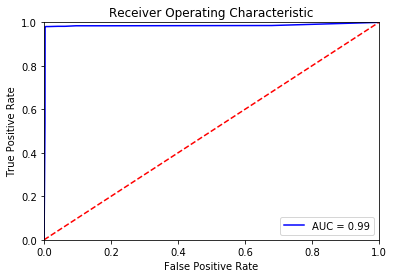

In [11]:
from sklearn import metrics

pca, model = best_model[-2], best_model[-1]
probs = model.predict_proba(pca.transform(X_test))
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

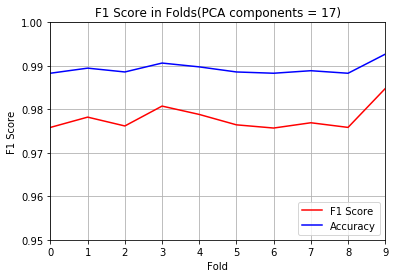

In [12]:
f1_r, acc_r = [], []
for f1, acc in metrics_:
    f1_r.append(f1)
    acc_r.append(acc)

f1_r, acc_r = np.array(f1_r), np.array(acc_r)
l = f1_r.shape[0]
plt.title(f'F1 Score in Folds(PCA components = {pca_components})')
plt.plot(range(l), f1_r, 'r', label = 'F1 Score')
plt.plot(range(l), acc_r, 'b', label = 'Accuracy')
plt.legend(loc = 'lower right')
plt.xticks(range(l))
plt.xlim([0, l - 1])
plt.ylim([0.95, 1])
plt.ylabel('F1 Score')
plt.xlabel('Fold')
plt.grid()
plt.show()

## Plot feature importances

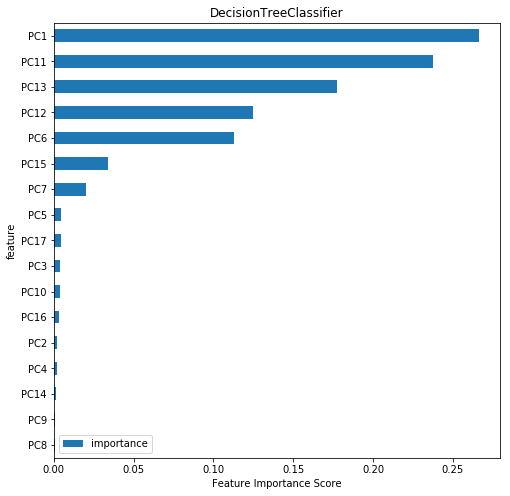

In [13]:
def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
#     https://www.kaggle.com/grfiv4/plotting-feature-importances
    __name__ = "plot_feature_importances"
    
    import pandas as pd
    import numpy  as np
    import matplotlib.pyplot as plt
    
    X_train = pd.DataFrame(data=X_train, columns=[f"PC{i}" for i in range(1, X_train.shape[1] + 1)])
    
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    
    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(title=title, figsize=figsize)
    plt.xlabel('Feature Importance Score')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

pca, clf = best_model[-2], best_model[-1]
feature_importance = plot_feature_importances(clf, pca.transform(X_train), top_n=X_train.shape[1], title=clf.__class__.__name__)

## Get Features Used to Generate PCA Components

In [14]:
# https://stackoverflow.com/questions/22348668/pca-decomposition-with-python-features-relevances
pca, clf = best_model[-2], best_model[-1]
index_components = [int(x[2:]) for x in feature_importance.index.values]
def features_used_to_generate_pca_components(index_components, pca, clf, columns_names):    
    for i in index_components:
        index_features = np.abs(pca.components_[i - 1]).argsort()[:4]
        features = columns_names[index_features]
        print(f'PC{i}')
        print(f'Features:')
        for f in features:
            print("\t" + f)
        print()
        
features_used_to_generate_pca_components(index_components, pca, clf, columns_names)

PC8
Features:
	workclass_Local-gov workclass_Never-worked
	marital-status_Married-AF-spouse
	income workclass_Never-worked
	workclass_Never-worked

PC9
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Never-worked
	marital-status_Separated
	occupation_Armed-Forces

PC14
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Never-worked
	occupation_Armed-Forces
	marital-status_Married-AF-spouse

PC4
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Never-worked
	occupation_Armed-Forces
	workclass_Self-emp-inc

PC2
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Without-pay
	workclass_Never-worked
	occupation_Armed-Forces

PC16
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Never-worked
	occupation_Armed-Forces
	workclass_Without-pay

PC10
Features:
	workclass_Local-gov workclass_Never-worked
	workclass_Never-worked
	occupation_Armed-Forces
	income workclass_?

PC3
Features:
	workclass_Local-gov workclass_Never-

## Confusion Matrix

In [15]:
from sklearn.metrics import confusion_matrix

pca, clf = best_model[-2], best_model[-1]

y_pred = clf.predict(pca.transform(X_test))

cm = confusion_matrix(y_test, y_pred)
cm

array([[2584,    8],
       [  17,  809]])

Normalized confusion matrix
[[0.99691358 0.00308642]
 [0.02058111 0.97941889]]


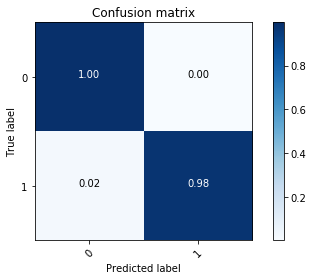

In [16]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
plot_confusion_matrix(cm, [0, 1], True)

## Classification Report

In [17]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2592
           1       0.99      0.98      0.98       826

   micro avg       0.99      0.99      0.99      3418
   macro avg       0.99      0.99      0.99      3418
weighted avg       0.99      0.99      0.99      3418



# Save Best Model

In [18]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(best_model[-1], out_file='tree.dot', 
                #feature_names = iris.feature_names,
                class_names = [">= 50K", "< 50K"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [19]:
from sklearn.externals import joblib

joblib.dump(best_model, 'lgr.joblib')

['lgr.joblib']